In [1]:
%matplotlib inline
from IPython.display import Audio
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
sns.set_style('darkgrid')

In [2]:
moi_aimer_toi = r'D:\sagniD\audio_data\moiaimertoi.mp3'  # a nice song by Vianney
y, sr = librosa.load(moi_aimer_toi, sr=8000)

In [3]:
Audio(data=y, rate=sr)

In [4]:
y_stereo, sr = librosa.load(moi_aimer_toi, sr=8000, mono=False)

In [5]:
Audio(data=y_stereo, rate=sr)

There *is* a perceptible difference between mono and stereo audio, but I am willing to sacrifice a little bit of quality to make it a little easier for me to get *something* up and ready.

In [6]:
mel_spec = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=256, hop_length=64)

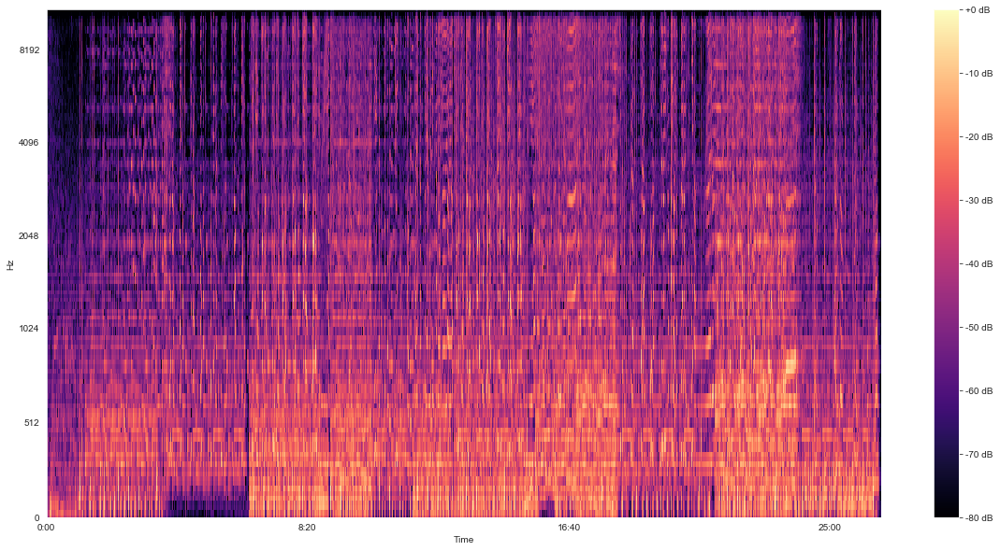

In [12]:
plt.subplots(figsize=(20, 10))
librosa.display.specshow(librosa.power_to_db(mel_spec, ref=np.max), x_axis='time', y_axis='mel', sr=sr)
plt.colorbar(format='%+2.0f dB')

In [8]:
mel_spec.shape

(128, 24977)

In [9]:
np.max(mel_spec), np.min(mel_spec)

(60.27952834839994, 0.0)

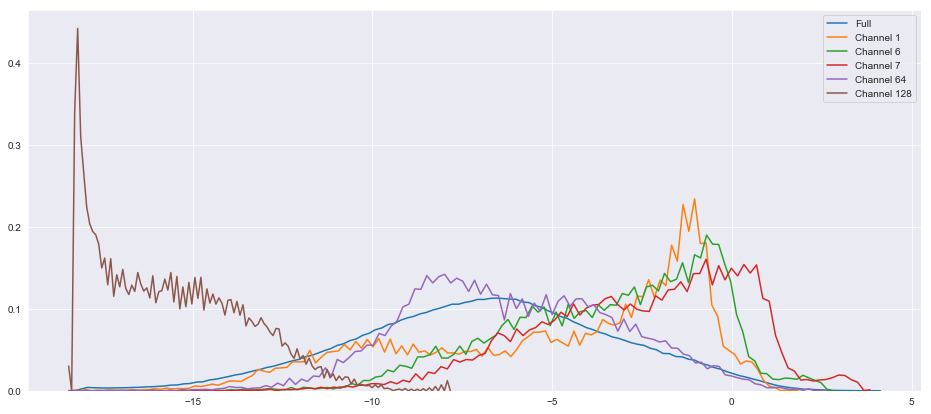

In [10]:
eps = 1e-8
plt.figure(figsize=(16, 7))
sns.kdeplot(np.log(mel_spec.reshape(-1) + eps), bw=1e-2, label='Full')
sns.kdeplot(np.log(mel_spec[0] + eps), bw=1e-2, label='Channel 1')
sns.kdeplot(np.log(mel_spec[5] + eps), bw=1e-2, label='Channel 6')
sns.kdeplot(np.log(mel_spec[6] + eps), bw=1e-2, label='Channel 7')
sns.kdeplot(np.log(mel_spec[63] + eps), bw=1e-2, label='Channel 64')
sns.kdeplot(np.log(mel_spec[127] + eps), bw=1e-2, label='Channel 128')